In [45]:
import tensorflow as tf
import os
import pathlib
import time
import datetime
import numpy as np
import matplotlib.pyplot as plt
from IPython import display
from PIL import Image
import PIL.Image
import sys
from PIL import Image

In [69]:
#Ruta raiz
#Ruta de datos de entrada
INPATH= 'Galaxias1'
#Ruta de datos de salida
OUPATH= 'DM1'
#Ruta de los checkpoints
CKPATH='checkpoints'

contenido = os.listdir(INPATH)
imagenes = []
for fichero in contenido:
    if os.path.isfile(os.path.join(INPATH, fichero)) and fichero.endswith('.jpg'):
        imagenes.append(fichero)
        
imgurls= imagenes
n=44
train_n= round(n*-0.90) 
#Listado randomizado.
#randurls=np.copy(imgurls)
randurls=imgurls

#np.random.shuffle(randurls)
#Partición train/test.

tr_urls=randurls[:train_n]
ts_urls=randurls[train_n:n]
print(len(imgurls), len(tr_urls), len(ts_urls))

44 4 40


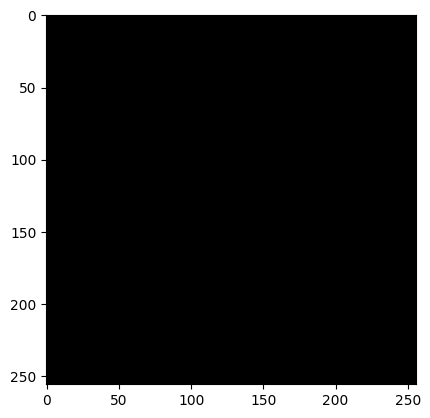

In [47]:
IMG_WIDTH = 256
IMG_HEIGHT=256
def resize(inimg, tgimg, height, width):
  inimg = tf.image.resize(inimg,  [height, width])
                               
  tgimg = tf.image.resize(tgimg, [height, width])                             

  return inimg, tgimg

# Normalizing the images to [-1, 1]
def normalize(inimg, tgimg):
  inimg = (inimg / 127.5) - 1
  tgimg = (tgimg / 127.5) - 1

  return inimg, tgimg

@tf.function()
def random_jitter(inimg, tgimg):
  # Resizing to 286x286
  inimg, tgimg = resize(inimg, tgimg, 286, 286)

  stacked_image = tf.stack([inimg, tgimg], axis=0)
  cropped_image = tf.image.random_crop(stacked_image, size=[2, IMG_HEIGHT, IMG_WIDTH, 3])

  inimg, tgimg = cropped_image[0], cropped_image[1]

  if tf.random.uniform(()) > 0.5:
    # Random mirroring
    inimg = tf.image.flip_left_right(inimg)
    tgimg = tf.image.flip_left_right(tgimg)

  return inimg, tgimg

def load_image(filename, augment=True):

  inimg=tf.cast(tf.image.decode_jpeg(tf.io.read_file(INPATH+'/'+filename)), tf.float32)[..., :3]
  tgimg=tf.cast(tf.image.decode_jpeg(tf.io.read_file(OUPATH+'/'+filename)), tf.float32)[..., :3]
  
  inimg, tgimg=resize(inimg, tgimg, IMG_HEIGHT, IMG_WIDTH)

  if augment:
    inimg, tgimg=random_jitter(inimg, tgimg)
    
  inimg, tgimg=normalize(inimg, tgimg)

  return inimg, tgimg

def load_train_image(filename):
  return load_image(filename, True)
def load_test_image(filename):
  return load_image(filename, False)

plt.imshow(((load_train_image(randurls[0])[1])+1)/2)

In [70]:
train_dataset=tf.data.Dataset.from_tensor_slices(tr_urls)
train_dataset=train_dataset.map(load_train_image, num_parallel_calls=tf.data.experimental.AUTOTUNE)
train_dataset=train_dataset.batch(1)


test_dataset=tf.data.Dataset.from_tensor_slices(ts_urls)
test_dataset=test_dataset.map(load_test_image, num_parallel_calls=tf.data.experimental.AUTOTUNE)
test_dataset=test_dataset.batch(1)

In [49]:
from tensorflow.keras import * 
from tensorflow.keras.layers import * 
def downsample(filters, apply_batchnorm=True):
  
  result = Sequential()
  initializer = tf.random_normal_initializer(0., 0.02)
  result.add(Conv2D(filters, 
                    kernel_size=4, 
                    strides=2, 
                    padding='same',
                    kernel_initializer=initializer, 
                    use_bias= not apply_batchnorm))

  if apply_batchnorm:
    result.add(BatchNormalization())

  result.add(LeakyReLU())

  return result
downsample(61)

In [50]:
def upsample(filters, apply_dropout=False):
  
  result = Sequential()
  initializer = tf.random_normal_initializer(0., 0.02)
  
  result.add(Conv2DTranspose(filters, 
                             kernel_size=4, 
                             strides=2,
                             padding='same',
                             kernel_initializer=initializer,
                             use_bias=False))

  result.add(BatchNormalization())

  if apply_dropout:
      result.add(Dropout(0.5))

  result.add(ReLU())

  return result
upsample(64)

In [51]:

def Generator():

  inputs = tf.keras.layers.Input(shape=[None, None, 3])

  down_stack = [
    downsample(64, apply_batchnorm=False),  # (batch_size, 128, 128, 64)
    downsample(128),                        # (batch_size, 64, 64, 128)
    downsample(256),                        # (batch_size, 32, 32, 256)
    downsample(512),                        # (batch_size, 16, 16, 512)
    downsample(512),                        # (batch_size, 8, 8, 512)
    downsample(512),                        # (batch_size, 4, 4, 512)
    downsample(512),                        # (batch_size, 2, 2, 512)
    downsample(512),                        # (batch_size, 1, 1, 512)
  ]

  up_stack = [
    upsample(512, apply_dropout=True),  # (batch_size, 2, 2, 1024)
    upsample(512, apply_dropout=True),  # (batch_size, 4, 4, 1024)
    upsample(512, apply_dropout=True),  # (batch_size, 8, 8, 1024)
    upsample(512),                      # (batch_size, 16, 16, 1024)
    upsample(256),                      # (batch_size, 32, 32, 512)
    upsample(128),                      # (batch_size, 64, 64, 256)
    upsample(64),                       # (batch_size, 128, 128, 128)
  ]

  initializer = tf.random_normal_initializer(0., 0.02)

  last = tf.keras.layers.Conv2DTranspose(filters = 3,
                                         kernel_size = 4,
                                         strides=2,
                                         padding='same',
                                         kernel_initializer=initializer,
                                         activation='tanh')  # (batch_size, 256, 256, 3)

  x = inputs
  # Downsampling through the model
  skips = []
  for down in down_stack:
    x = down(x)
    skips.append(x)

  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    x = Concatenate()([x, skip])

  last = last(x)

  return Model(inputs=inputs, outputs=last)
generator= Generator()


Visualize the generator model architecture:

In [52]:
from sys import last_traceback
def Discriminator():
  
  ini = Input(shape=[None, None, 3], name='input_img')
  gen = Input(shape=[None, None, 3], name='gener_img')

  con = concatenate([ini, gen])  # (batch_size, 256, 256, channels*2)

  initializer = tf.random_normal_initializer(0., 0.02)

  down1 = downsample(64, apply_batchnorm=False)(con)  # (batch_size, 128, 128, 64)
  down2 = downsample(128)(down1)  # (batch_size, 64, 64, 128)
  down3 = downsample(256)(down2)  # (batch_size, 32, 32, 256)
  down4 = downsample(512)(down3) 

  last = tf.keras.layers.Conv2D(filters=1, 
                                kernel_size=4, 
                                strides=1,
                                kernel_initializer=initializer,
                                padding='same')(down4)  # (batch_size, 31, 31, 512)


  return tf.keras.Model(inputs=[ini, gen], outputs=last)
discriminator=Discriminator()

In [53]:
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [54]:
def discriminator_loss(disc_real_output, disc_generated_output):
  
  real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)

  generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

  total_disc_loss = real_loss + generated_loss

  return total_disc_loss

In [55]:
LAMBDA = 100
def generator_loss(disc_generated_output, gen_output, target):
  gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)

  # Mean absolute error
  l1_loss = tf.reduce_mean(tf.abs(target - gen_output))

  total_gen_loss = gan_loss + (LAMBDA * l1_loss)

  return total_gen_loss

In [56]:
import os

generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

checkpoint_prefix = os.path.join(CKPATH, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

In [57]:
def generate_images(model, test_input, tar, save_filename=False,m=False, display_imgs=True):

  prediction = model(test_input, training=True)
 

  if save_filename:
    tf.keras.preprocessing.image.save_img("output/" + save_filename +'.jpg', prediction[0,...])

  plt.figure(figsize=(10,10))

  display_list = [test_input[0], tar[0], prediction[0]]
  title = ['Entrada', 'Original', 'Predicho']

  for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.title(title[i])
    # Getting the pixel values in the [0, 1] range to plot.
    plt.imshow(display_list[i] * 0.5 + 0.5)
    plt.axis('off')
    plt.savefig("output/juntas/"+m+".png",dpi=400, bbox_inches='tight')
    
  plt.show()

In [58]:
def generate_images2(model, test_input,m=False, display_imgs=True):

  prediction = model(test_input, training=True)
 
  plt.figure(figsize=(10,10))

  display_list = [test_input[0], prediction[0]]
  title = ['Entrada', 'Predicho']

  for i in range(2):
    plt.subplot(1, 2, i+1)
    plt.title(title[i])
    # Getting the pixel values in the [0, 1] range to plot.
    plt.imshow(display_list[i] * 0.5 + 0.5)
    plt.axis('off')
    plt.savefig("output/Galaxias/"+m+".png",dpi=400, bbox_inches='tight')
    
  plt.show()
  

In [59]:
@tf.function
def train_step(input_image, target):

  with tf.GradientTape() as gen_tape, tf.GradientTape() as discr_tape:

    output_image=generator(input_image, training=True)

    output_gen_discr=discriminator([output_image, input_image], training=True)

    output_trg_discr=discriminator([target, input_image], training=True)

    discr_loss=discriminator_loss(output_trg_discr, output_gen_discr)

    gen_loss=generator_loss(output_gen_discr, output_image, target)

    generator_grads=gen_tape.gradient(gen_loss, generator.trainable_variables)

    discriminator_grads=discr_tape.gradient(discr_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(generator_grads, generator.trainable_variables))

    discriminator_optimizer.apply_gradients(zip(discriminator_grads, discriminator.trainable_variables))

In [26]:
from IPython.display import clear_output

def train(dataset, epochs):
  for epoch in range(epochs):
    imgi=0
    for inimg, tgimg in dataset:
      print( 'epoch' +str(epoch) + 'train:'+str(imgi)+'/'+str(len(tr_urls)))
      imgi+=1
      train_step(inimg,tgimg)
      clear_output(wait=True)
    imgi=0
    for inp, tar in test_dataset.take(10):
      generate_images(generator, inp, tar, display_imgs=True)
      imgi+= 1
      #saving (checkpoint) the model every 20 epochs
    if (epoch+ 1)% 1000 == 0:
      checkpoint.save(file_prefix=checkpoint_prefix)

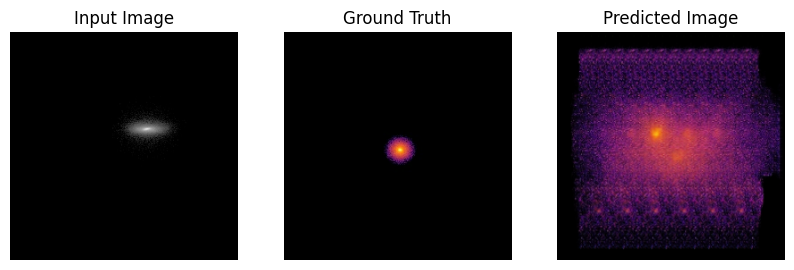

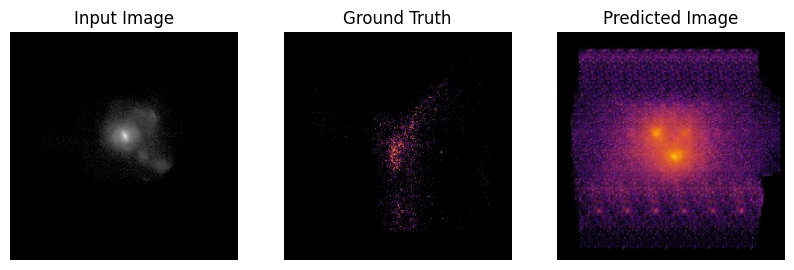

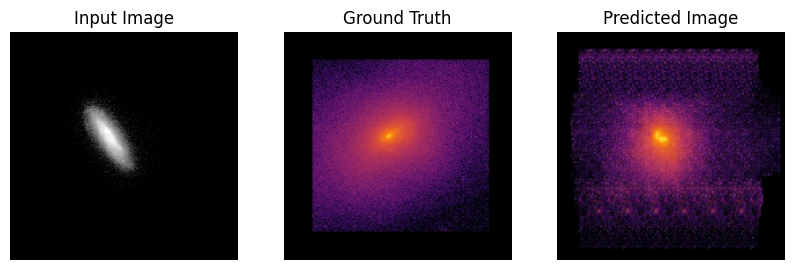

KeyboardInterrupt: 

In [39]:
train(train_dataset,9000)

In [ ]:
!pip install Pillow

## Restore the latest checkpoint and test the network

In [63]:
# Restoring the latest checkpoint in checkpoint_dir
checkpoint.restore(tf.train.latest_checkpoint(CKPATH))

In [97]:
from PIL import Image
import matplotlib as plt
import cv2 as cv
for i in range(1,30):
    try:
        m=str(i) #String
        ruta = 'Galaxias/'+m+'.png'
        image = cv.imread(ruta)
        image1= cv.resize(image,(256,256))
        cv.imwrite('Galaxias1/'+m+'.jpg', image1)
       
    except:
        pass

In [4]:
from PIL import Image
import cv2 as cv
for i in range(1,400):
    try:
        m=str(i) #String
        ruta = 'DM/'+m+'.png'
        image = cv.imread(ruta)
        image1= cv.resize(image,(256,256))
        cv.imwrite('DM1/'+m+'.jpg', image1)
        
    except:
        pass

In [73]:
from PIL import Image
import cv2 as cv
for i in range(44,50):
    try:
        m=str(i) #String
        ruta2 = 'Galaxias/'+m+'.jpg'
        img = Image.open(ruta2)
        imgGray = img.convert('L')
        imgGray.save('Galaxias1/'+m+'.jpg')
        ruta = 'Galaxias1/'+m+'.jpg'
        image = cv.imread(ruta)
        image1= cv.resize(image,(256,256))
        cv.imwrite('Galaxias1/'+m+'.jpg', image1)
        
        
    except:
        pass

In [144]:
# Run the trained model on a few examples from the test set
n=1
m=1
for inimg, tgimg in test_dataset.take(12):
  generate_images(generator, inimg, tgimg,str(n),str(m))
  n=n+1
  m=m+1

KeyboardInterrupt: 

Error in callback <function _draw_all_if_interactive at 0x000001D4825545E0> (for post_execute):



KeyboardInterrupt



Error in callback <function flush_figures at 0x000001D485D0F5B0> (for post_execute):


KeyboardInterrupt: 

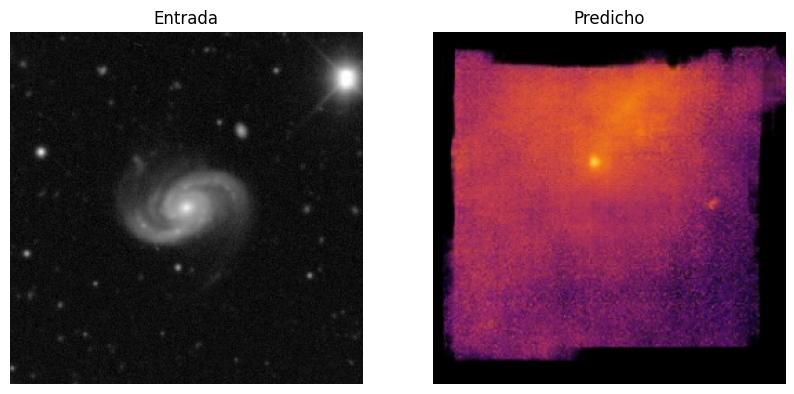

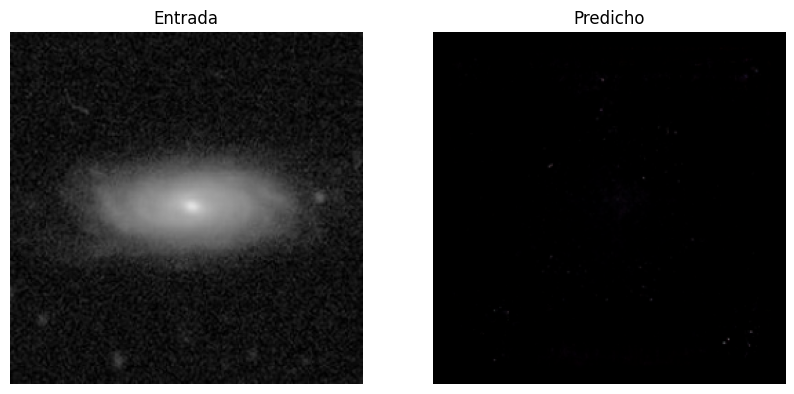

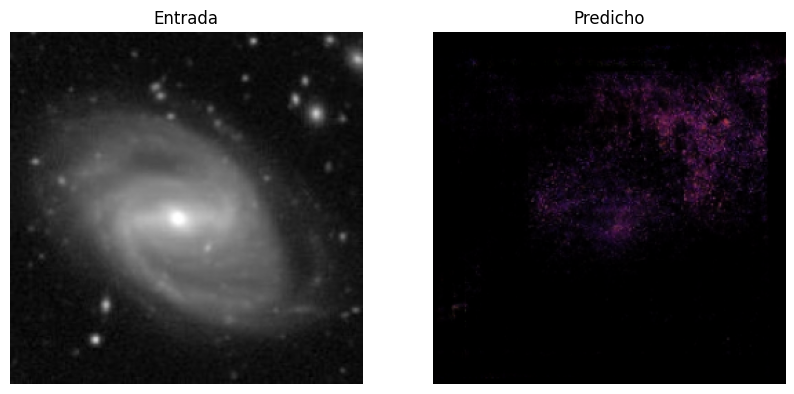

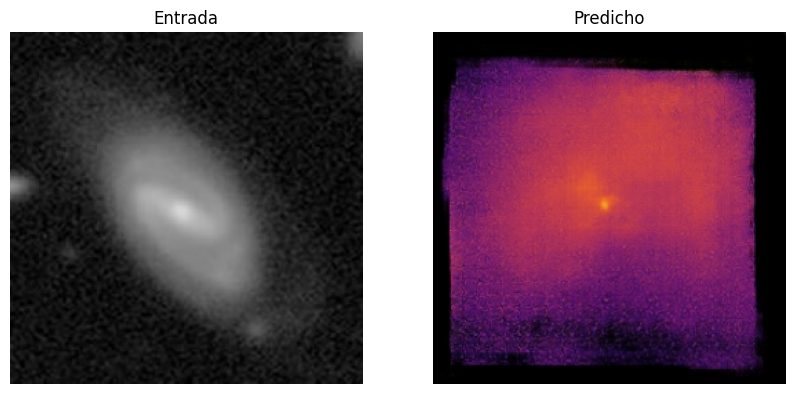

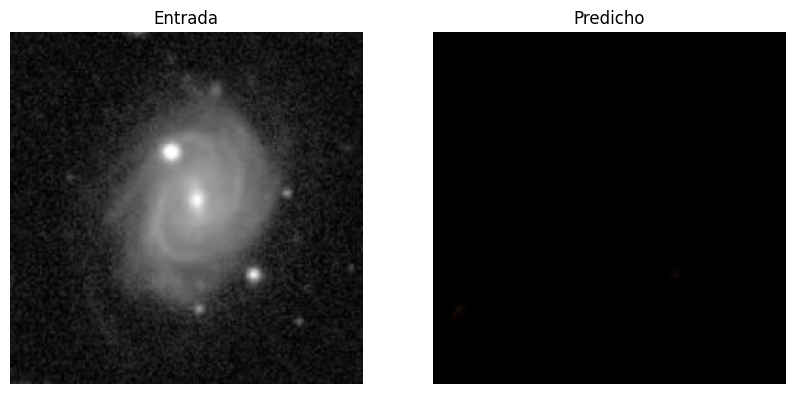

...

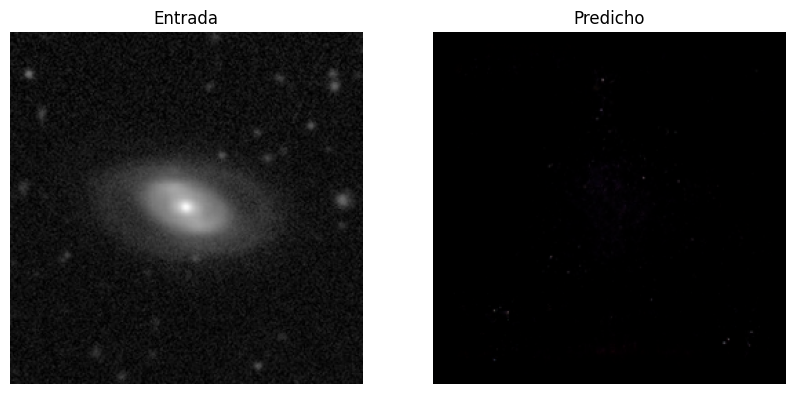

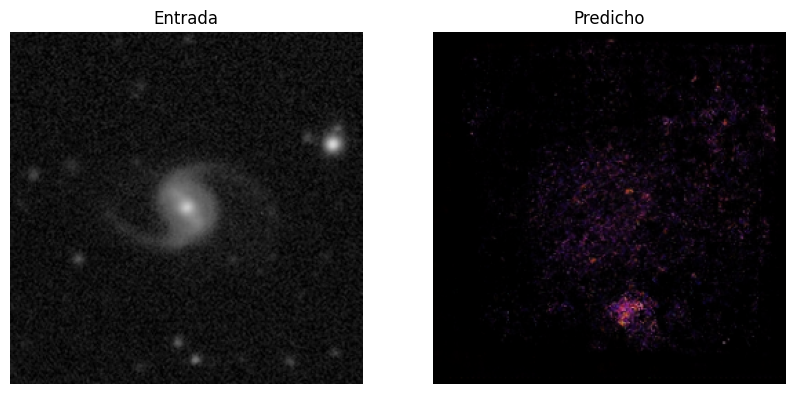

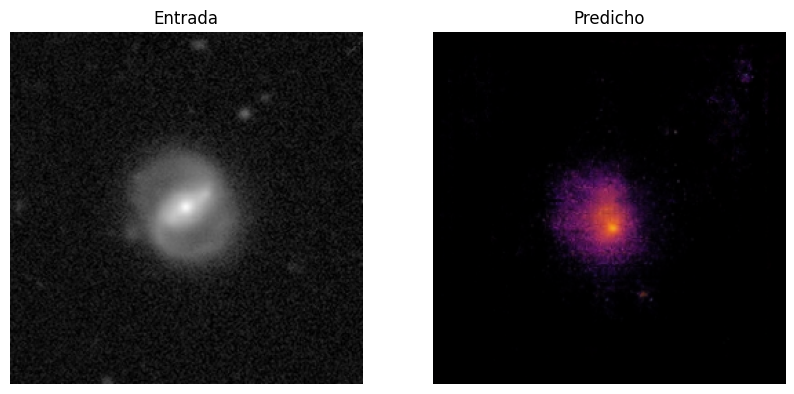

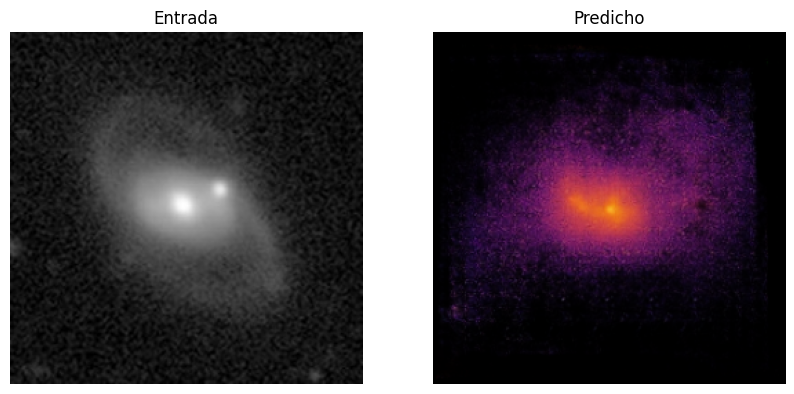

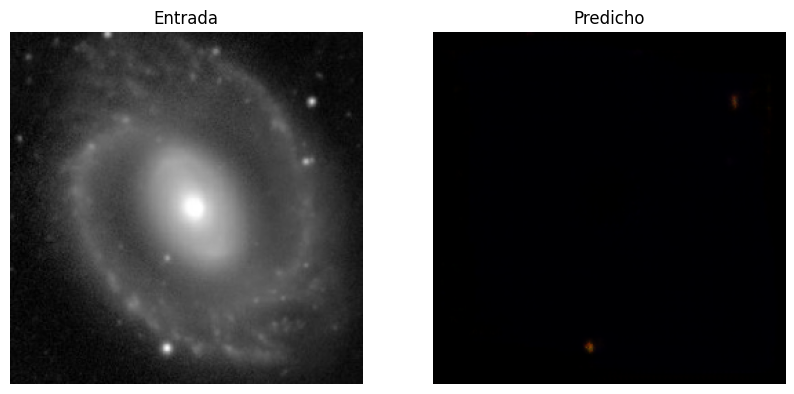

In [74]:
# Run the trained model on a few examples from the test set
m=0
for inimg, tgimg in test_dataset.take(50):
  generate_images2(generator, inimg,str(m))
  m=m+1